# 0.&nbsp;Student Information
*   **Student ID:** 20520816
*   **Full Name:** Đỗ Thị Thu Trang

# 1.&nbsp;Import Libraries

In [1]:
!pip install catboost

In [2]:
!pip install --upgrade catboost

In [3]:
!pip install --upgrade scikit-learn

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab

In [5]:
from catboost import CatBoostClassifier
import warnings
warnings.filterwarnings("ignore")

In [6]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.model_selection import KFold,train_test_split
from sklearn.metrics import f1_score,recall_score,accuracy_score,precision_score,confusion_matrix,classification_report,ConfusionMatrixDisplay,precision_recall_fscore_support

# 2.&nbsp;Dataset

In [7]:
df = pd.read_csv('./CleanedCreditScore.csv')
df_onehot = pd.read_csv('./CreditScore_OneHot.csv')

In [8]:
print ('Shape of df:', df.shape)
print ('Shape of df_onehot:', df_onehot.shape)

Shape of df: (100000, 34)
Shape of df_onehot: (100000, 57)


# 3.&nbsp;CatBoost Model

## 3.1.&nbsp;Without OneHotEncoder

### 3.1.1.&nbsp;Train-Test Split

In [31]:
X = df.iloc[:, :-1]
y = df.iloc[:, -1]

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Train set: Shape of X is {X_train.shape} and shape of y is {y_train.shape} ")
print(f"Test set: Shape of X is {X_test.shape} and shape of y is {y_test.shape} ")

Train set: Shape of X is (80000, 33) and shape of y is (80000,) 
Test set: Shape of X is (20000, 33) and shape of y is (20000,) 


In [33]:
scaler = MinMaxScaler()
X_train_scaler = scaler.fit_transform(X_train)
X_test_scaler = scaler.fit_transform(X_test)

### 3.1.2.&nbsp;Default model

In [12]:
model = CatBoostClassifier()
model.fit(X_train_scaler, y_train)

Learning rate set to 0.098942


0:	learn: 1.0276557	total: 207ms	remaining: 3m 26s
1:	learn: 0.9720508	total: 271ms	remaining: 2m 15s
2:	learn: 0.9294994	total: 324ms	remaining: 1m 47s
3:	learn: 0.8922109	total: 381ms	remaining: 1m 34s
4:	learn: 0.8623868	total: 437ms	remaining: 1m 26s
5:	learn: 0.8366824	total: 538ms	remaining: 1m 29s
6:	learn: 0.8151574	total: 606ms	remaining: 1m 25s
7:	learn: 0.7967523	total: 680ms	remaining: 1m 24s
8:	learn: 0.7802227	total: 759ms	remaining: 1m 23s
9:	learn: 0.7659557	total: 833ms	remaining: 1m 22s
10:	learn: 0.7532334	total: 915ms	remaining: 1m 22s
11:	learn: 0.7421254	total: 986ms	remaining: 1m 21s
12:	learn: 0.7319343	total: 1.04s	remaining: 1m 18s
13:	learn: 0.7232175	total: 1.1s	remaining: 1m 17s
14:	learn: 0.7150494	total: 1.16s	remaining: 1m 15s
15:	learn: 0.7077353	total: 1.22s	remaining: 1m 14s
16:	learn: 0.7019530	total: 1.29s	remaining: 1m 14s
17:	learn: 0.6959812	total: 1.34s	remaining: 1m 13s
18:	learn: 0.6912334	total: 1.4s	remaining: 1m 12s
19:	learn: 0.6866662	tot

In [42]:
# Get parameters from the RandomForestClassifier
params_dict = model.get_all_params()

# Create a DataFrame from the parameters dictionary for inspection
pd.DataFrame.from_dict(params_dict, orient='index', columns=['Value'])

,Value
nan_mode,Min
eval_metric,MultiClass
iterations,1000
sampling_frequency,PerTree
leaf_estimation_method,Newton
random_score_type,NormalWithModelSizeDecrease
grow_policy,SymmetricTree
penalties_coefficient,1
boosting_type,Plain
model_shrink_mode,Constant


In [14]:
y_pred = model.predict(X_test_scaler)

# Display evaluation metrics
print("Result of the CatBoost default model no encode:")

print(f"Accuracy : {accuracy_score(y_test, y_pred):.3f}")
print(f"Average Macro Precision : {precision_score(y_test, y_pred, average='macro'):.3f}")
print(f"Average Macro Recall : {recall_score(y_test, y_pred, average='macro'):.3f}")
print(f"Average Macro F1 : {f1_score(y_test, y_pred, average='macro'):.3f}")

print(classification_report(y_test, y_pred))

Result of the CatBoost default model no encode:
Accuracy : 0.777
Average Macro Precision : 0.763
Average Macro Recall : 0.767
Average Macro F1 : 0.764
              precision    recall  f1-score   support

           0       0.71      0.75      0.73      3527
           1       0.78      0.75      0.77      5874
           2       0.80      0.80      0.80     10599

    accuracy                           0.78     20000
   macro avg       0.76      0.77      0.76     20000
weighted avg       0.78      0.78      0.78     20000



### 3.1.3.&nbsp;Tuning model

In [15]:
# GridSearch
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'l2_leaf_reg': [0.001, 0.01, 0.1]
}

model_ft = CatBoostClassifier()
grid_search = GridSearchCV(model_ft, param_grid=param_grid, scoring="accuracy")
grid_search.fit(X_train_scaler, y_train)

0:	learn: 1.0920935	total: 27.9ms	remaining: 27.8s
1:	learn: 1.0856789	total: 51ms	remaining: 25.4s
2:	learn: 1.0792663	total: 77.3ms	remaining: 25.7s
3:	learn: 1.0730915	total: 103ms	remaining: 25.6s
4:	learn: 1.0671871	total: 127ms	remaining: 25.2s
5:	learn: 1.0612235	total: 148ms	remaining: 24.5s
6:	learn: 1.0554611	total: 172ms	remaining: 24.4s
7:	learn: 1.0497598	total: 194ms	remaining: 24.1s
8:	learn: 1.0442857	total: 221ms	remaining: 24.3s
9:	learn: 1.0388755	total: 247ms	remaining: 24.4s
10:	learn: 1.0335354	total: 280ms	remaining: 25.1s
11:	learn: 1.0283332	total: 309ms	remaining: 25.5s
12:	learn: 1.0232196	total: 341ms	remaining: 25.9s
13:	learn: 1.0182738	total: 454ms	remaining: 32s
14:	learn: 1.0133998	total: 527ms	remaining: 34.6s
15:	learn: 1.0086027	total: 608ms	remaining: 37.4s
16:	learn: 1.0038333	total: 641ms	remaining: 37.1s
17:	learn: 0.9993203	total: 674ms	remaining: 36.7s
18:	learn: 0.9949792	total: 705ms	remaining: 36.4s
19:	learn: 0.9905392	total: 740ms	remainin

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x0000022720D82C10>,
             param_grid={'l2_leaf_reg': [0.001, 0.01, 0.1],
                         'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 5, 7]},
             scoring='accuracy')

In [30]:
# Extracting Grid Search results information and converting it to a DataFrame
results_df = pd.DataFrame(grid_search.cv_results_)

# Sorting the DataFrame based on rank_test_score in ascending order
results_df = results_df.sort_values(by='rank_test_score')

# Saving the selected DataFrame to a CSV file
results_df.to_csv('GridSearchCV_CatBoost.csv', index=False)

In [35]:
# Get best model
best_model = grid_search.best_estimator_

# Get parameter and accuracy score
params = best_model.get_params()
accuracy = best_model.score(X_test_scaler, y_test)

print(f"Parameters: {params} \nAccuracy Score: {accuracy}")

Parameters: {'l2_leaf_reg': 0.001, 'learning_rate': 0.1, 'max_depth': 7} 
Accuracy Score: 0.80385


In [36]:
y_pred = best_model.predict(X_test_scaler)

# Display evaluation metrics
print("Result of the default CatBoost model without encoder: /n")

print(f"Accuracy : {accuracy_score(y_test, y_pred):.3f}")
print(f"Average Macro Precision : {precision_score(y_test, y_pred, average='macro'):.3f}")
print(f"Average Macro Recall : {recall_score(y_test, y_pred, average='macro'):.3f}")
print(f"Average Macro F1 : {f1_score(y_test, y_pred, average='macro'):.3f}")

print(classification_report(y_test, y_pred))

Result of the default CatBoost model without encoder: /n
Accuracy : 0.804
Average Macro Precision : 0.793
Average Macro Recall : 0.795
Average Macro F1 : 0.794
              precision    recall  f1-score   support

           0       0.76      0.77      0.76      3527
           1       0.80      0.80      0.80      5874
           2       0.82      0.82      0.82     10599

    accuracy                           0.80     20000
   macro avg       0.79      0.80      0.79     20000
weighted avg       0.80      0.80      0.80     20000



## 3.2.&nbsp;With OneHotEncoder

### 3.2.1.&nbsp;Train-Test Split

In [46]:
X_onehot = df_onehot.iloc[:, :-1].values
y_onehot = df_onehot.iloc[:, -1].values

In [47]:
X_train_onehot, X_test_onehot, y_train, y_test = train_test_split(X_onehot, y_onehot, test_size=0.2, random_state=42)

print(f"Train set: Shape of X is {X_train_onehot.shape} and shape of y is {y_train.shape} ")
print(f"Test set: Shape of X is {X_test_onehot.shape} and shape of y is {y_test.shape} ")

Train set: Shape of X is (80000, 56) and shape of y is (80000,) 
Test set: Shape of X is (20000, 56) and shape of y is (20000,) 


In [48]:
scaler = MinMaxScaler()
X_train_onehot_scaler = scaler.fit_transform(X_train_onehot)
X_test_onehot_scaler = scaler.fit_transform(X_test_onehot)

### 3.2.2.&nbsp;Default model

In [22]:
model = CatBoostClassifier()
model.fit(X_train_onehot_scaler, y_train)

Learning rate set to 0.098942
0:	learn: 1.0308235	total: 60.6ms	remaining: 1m
1:	learn: 0.9761220	total: 125ms	remaining: 1m 2s
2:	learn: 0.9334034	total: 185ms	remaining: 1m 1s
3:	learn: 0.8967428	total: 256ms	remaining: 1m 3s
4:	learn: 0.8647536	total: 316ms	remaining: 1m 2s
5:	learn: 0.8390648	total: 375ms	remaining: 1m 2s
6:	learn: 0.8166660	total: 434ms	remaining: 1m 1s
7:	learn: 0.7972464	total: 479ms	remaining: 59.4s
8:	learn: 0.7808034	total: 537ms	remaining: 59.1s
9:	learn: 0.7664686	total: 583ms	remaining: 57.8s
10:	learn: 0.7533784	total: 633ms	remaining: 56.9s
11:	learn: 0.7415171	total: 687ms	remaining: 56.6s
12:	learn: 0.7320301	total: 748ms	remaining: 56.8s
13:	learn: 0.7233198	total: 806ms	remaining: 56.7s
14:	learn: 0.7164478	total: 860ms	remaining: 56.5s
15:	learn: 0.7090652	total: 915ms	remaining: 56.3s
16:	learn: 0.7028375	total: 970ms	remaining: 56.1s
17:	learn: 0.6972093	total: 1.02s	remaining: 55.9s
18:	learn: 0.6922799	total: 1.08s	remaining: 55.7s
19:	learn: 0.

In [24]:
y_pred = model.predict(X_test_onehot_scaler)

# Display evaluation metrics
print("Result of the default CatBoost model (encode):")

print(f"Accuracy : {accuracy_score(y_test, y_pred):.3f}")
print(f"Average Macro Precision : {precision_score(y_test, y_pred, average='macro'):.3f}")
print(f"Average Macro Recall : {recall_score(y_test, y_pred, average='macro'):.3f}")
print(f"Average Macro F1 : {f1_score(y_test, y_pred, average='macro'):.3f}")

print(classification_report(y_test, y_pred))

Result of the default CatBoost model (encode):
Accuracy : 0.778
Average Macro Precision : 0.765
Average Macro Recall : 0.768
Average Macro F1 : 0.766
              precision    recall  f1-score   support

        Good       0.71      0.75      0.73      3527
        Poor       0.78      0.75      0.77      5874
    Standard       0.80      0.80      0.80     10599

    accuracy                           0.78     20000
   macro avg       0.76      0.77      0.77     20000
weighted avg       0.78      0.78      0.78     20000



### 3.2.3.&nbsp;Tuning model

In [25]:
param_grid = {
    "learning_rate": [0.01, 0.05, 0.1],
    "depth": [3, 5, 7],
    "l2_leaf_reg": [0.001, 0.01, 0.1]
}
model_ft = CatBoostClassifier()
onehot_grid_search = GridSearchCV(model_ft, param_grid=param_grid, scoring="accuracy")
onehot_grid_search.fit(X_train_onehot_scaler, y_train)

0:	learn: 1.0919607	total: 23.2ms	remaining: 23.2s
1:	learn: 1.0856304	total: 46.3ms	remaining: 23.1s
2:	learn: 1.0793286	total: 69.8ms	remaining: 23.2s
3:	learn: 1.0730707	total: 93.8ms	remaining: 23.4s
4:	learn: 1.0672029	total: 120ms	remaining: 23.9s
5:	learn: 1.0613883	total: 145ms	remaining: 24s
6:	learn: 1.0555680	total: 171ms	remaining: 24.3s
7:	learn: 1.0499133	total: 192ms	remaining: 23.8s
8:	learn: 1.0444070	total: 212ms	remaining: 23.4s
9:	learn: 1.0390738	total: 235ms	remaining: 23.3s
10:	learn: 1.0338233	total: 257ms	remaining: 23.1s
11:	learn: 1.0285681	total: 279ms	remaining: 23s
12:	learn: 1.0235972	total: 300ms	remaining: 22.8s
13:	learn: 1.0186657	total: 322ms	remaining: 22.6s
14:	learn: 1.0137525	total: 343ms	remaining: 22.5s
15:	learn: 1.0089128	total: 365ms	remaining: 22.5s
16:	learn: 1.0042922	total: 384ms	remaining: 22.2s
17:	learn: 0.9997440	total: 402ms	remaining: 21.9s
18:	learn: 0.9953761	total: 422ms	remaining: 21.8s
19:	learn: 0.9910099	total: 443ms	remaini

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x0000022720DA3B50>,
             param_grid={'depth': [3, 5, 7], 'l2_leaf_reg': [0.001, 0.01, 0.1],
                         'learning_rate': [0.01, 0.05, 0.1]},
             scoring='accuracy')

In [29]:
# Extracting Grid Search results information and converting it to a DataFrame
results_df = pd.DataFrame(onehot_grid_search.cv_results_)

# Sorting the DataFrame based on rank_test_score in ascending order
results_df = results_df.sort_values(by='rank_test_score')

# Saving the selected DataFrame to a CSV file
results_df.to_csv('GridSearchCV_CatBoost_Onehot.csv', index=False)

In [49]:
# Get best model
onehot_best_model = onehot_grid_search.best_estimator_

# Save model
onehot_best_model.save_model("onehot_model.cbm")

# Get parameter and accuracy score
best_params = onehot_best_model.get_params()
best_accuracy = onehot_best_model.score(X_test_onehot_scaler, y_test)

print(f"Parameters: {best_params} \nAccuracy Score: {best_accuracy}")

Parameters: {'depth': 7, 'l2_leaf_reg': 0.001, 'learning_rate': 0.1} 
Accuracy Score: 0.8015


In [51]:
y_pred = onehot_best_model.predict(X_test_onehot_scaler)

# Display evaluation metrics
print("Result of the CatBoost tuning model (encode):")

print(f"Accuracy : {accuracy_score(y_test, y_pred):.3f}")
print(f"Average Macro Precision : {precision_score(y_test, y_pred, average='macro'):.3f}")
print(f"Average Macro Recall : {recall_score(y_test, y_pred, average='macro'):.3f}")
print(f"Average Macro F1 : {f1_score(y_test, y_pred, average='macro'):.3f}")

print(classification_report(y_test, y_pred))

Result of the CatBoost tuning model (encode):
Accuracy : 0.801
Average Macro Precision : 0.790
Average Macro Recall : 0.794
Average Macro F1 : 0.792
              precision    recall  f1-score   support

        Good       0.75      0.78      0.76      3527
        Poor       0.80      0.79      0.79      5874
    Standard       0.82      0.82      0.82     10599

    accuracy                           0.80     20000
   macro avg       0.79      0.79      0.79     20000
weighted avg       0.80      0.80      0.80     20000



# 4.&nbsp;Evaluation

## 4.1.&nbsp;Cross Validation (K-Fold)

In [56]:
kfold_model = CatBoostClassifier(**best_params)
X = df_onehot.iloc[:, :-1].values
y = df_onehot.iloc[:, -1].values

In [57]:
# Plot accuracy, macro average precision, recall and f1 score
# Define class labels for better interpretation
target_names = ['Good', 'Poor', 'Standard']

# Initialize K-Fold cross-validator with 10 splits and shuffle the data
kf = KFold(n_splits=10, shuffle=True)

# List to store metrics for each fold
metrics = []

# Lists to store performance metrics across all folds
acc = []  # Accuracy
f1_macro = []  # Macro-average F1 score
recall_macro = []  # Macro-average recall
precision_macro = []  # Macro-average precision

# Initialize an array to store confusion matrices
confusion_matrices = np.zeros((3, 3))

# Iterate over each fold
for i, (train_index, test_index) in enumerate(kf.split(X)):
    print(f"Fold {i}:")

    # Apply Min-Max scaling to the training data for the current fold
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X[train_index])

    # Fit the DecisionTreeClassifier on the scaled training data
    kfold_model.fit(X_train_scaled, y[train_index])

    # Apply Min-Max scaling to the test data for the current fold
    X_test_scaled = scaler.fit_transform(X[test_index])

    # Predict the labels for the scaled test data
    y_pred = kfold_model.predict(X_test_scaled)

    # Display the classification report with precision, recall, and F1 score
    print(classification_report(y[test_index], y_pred, target_names=target_names))

    # Calculate precision, recall, F1 score, and support for each class
    metrics.append(precision_recall_fscore_support(y[test_index], y_pred))
    print()

    # Calculate and store accuracy for the current fold
    acc.append(kfold_model.score(X_test_scaled, y[test_index]))

    # Calculate and store macro-average F1 score for the current fold
    f1_macro.append(f1_score(y[test_index], y_pred, average="macro"))

    # Calculate and store macro-average recall for the current fold
    recall_macro.append(recall_score(y[test_index], y_pred, average="macro"))

    # Calculate and store macro-average precision for the current fold
    precision_macro.append(precision_score(y[test_index], y_pred, average="macro"))

    # Update the confusion matrix with the results from the current fold
    confusion_matrices += confusion_matrix(y[test_index], y_pred)

# Calculate and display the mean accuracy across all folds
print(f"Mean accuracy: {np.mean(acc):.3f}")
print(f"Mean precision: {np.mean(precision_macro):.3f}")
print(f"Mean recall: {np.mean(recall_macro):.3f}")
print(f"Mean f1_score: {np.mean(f1_macro):.3f}")

Fold 0:
0:	learn: 1.0297452	total: 71.2ms	remaining: 1m 11s
1:	learn: 0.9713558	total: 138ms	remaining: 1m 8s
2:	learn: 0.9252166	total: 204ms	remaining: 1m 7s
3:	learn: 0.8875732	total: 264ms	remaining: 1m 5s
4:	learn: 0.8574166	total: 336ms	remaining: 1m 6s
5:	learn: 0.8313299	total: 408ms	remaining: 1m 7s
6:	learn: 0.8081165	total: 480ms	remaining: 1m 8s
7:	learn: 0.7891596	total: 538ms	remaining: 1m 6s
8:	learn: 0.7739967	total: 608ms	remaining: 1m 6s
9:	learn: 0.7589795	total: 670ms	remaining: 1m 6s
10:	learn: 0.7463715	total: 736ms	remaining: 1m 6s
11:	learn: 0.7350450	total: 801ms	remaining: 1m 5s
12:	learn: 0.7247012	total: 861ms	remaining: 1m 5s
13:	learn: 0.7156860	total: 927ms	remaining: 1m 5s
14:	learn: 0.7082285	total: 989ms	remaining: 1m 4s
15:	learn: 0.7019019	total: 1.05s	remaining: 1m 4s
16:	learn: 0.6951989	total: 1.11s	remaining: 1m 4s
17:	learn: 0.6898264	total: 1.17s	remaining: 1m 3s
18:	learn: 0.6843135	total: 1.23s	remaining: 1m 3s
19:	learn: 0.6799641	total: 1.2

## 4.2.&nbsp;Visualization

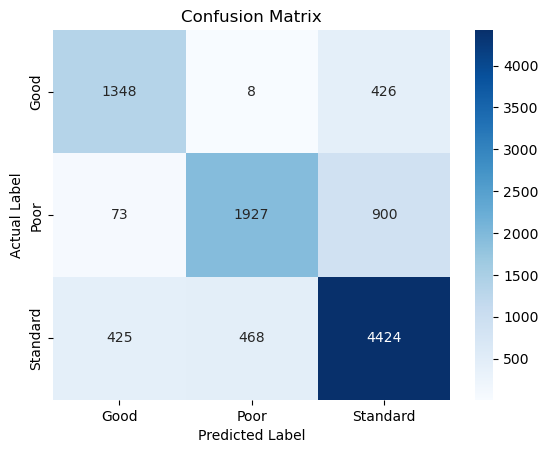

In [66]:
# Create labels for the confusion matrix
labels = ['Good', 'Poor', 'Standard']

# Create a heatmap using seaborn
sns.heatmap(np.round(confusion_matrices / 10).astype(np.int64), annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

# Set plot title and axes labels
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('Actual Label')

# Display the plot
plt.show()